# Проектная работа
# Рынок заведений общественного питания Москвы

#### Описание проекта  

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.  
В работе - датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Шаг 1. Загрузка данных и общая информация

In [1]:
import pandas as pd
import numpy as np
import datetime as dt
import matplotlib.pyplot as plt
import math
import seaborn as sns
from scipy import stats as st
from io import BytesIO
import requests
import re
import plotly.graph_objects as go
import plotly.express as px
from folium import Map, Marker, Choropleth
from folium.plugins import MarkerCluster

In [2]:
try:
    data = (pd.read_csv('/datasets/moscow_places.csv'))
except:
    data = (pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv'))

pd.options.display.max_colwidth = None
display(data.head())

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


#### Описание данных:  
* name — название заведения;  
* address — адрес заведения;  
* category — категория заведения, например «кафе», «пиццерия» или «кофейня»;  
* hours — информация о днях и часах работы;  
* lat — широта географической точки, в которой находится заведение;  
* lng — долгота географической точки, в которой находится заведение;  
* rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);  
* price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;  
* avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:  
«Средний счёт: 1000–1500 ₽»;  
«Цена чашки капучино: 130–220 ₽»;  
«Цена бокала пива: 400–600 ₽».  
и так далее;  
* middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.  
* middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:  
Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.  
Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.  
Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.  
* chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):  
0 — заведение не является сетевым  
1 — заведение является сетевым  
* district — административный район, в котором находится заведение, например Центральный административный округ;  
* seats — количество посадочных мест.

# Шаг 2. Предобработка данных

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [4]:
 print('Количество пропусков в значениях:', data.isna().sum())

Количество пропусков в значениях: name                    0
category                0
address                 0
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
dtype: int64


В данных очень много пропусков. Сведения о средней стоимости блюд и о среднем счете отсутсвуют более, чем в половине строк. Эти данные получены из системы Яндекс Бизнес и являются справочными. Заполнить эти данные нечем. Средние и медианные значения по столбцу могут сильно отличаться от реальных цифр. Если заполнить ими - анализ существенно исказится.   
Сведения о посадочных местах могут отсутсвовать у учреждений, работающих "на вынос" (кофейни, пиццерии), а также у заведений, работающих на фуд-кортах в ТЦ. Там посадочное простанство является общим для нескольких заведений. Или же данные отсутсвуют по причине ошибки выгрузки, или их просто не заполнили. Оставим пока пропуски как есть. 

In [5]:
print('Количество дублирующих записей:', data.duplicated().sum())

Количество дублирующих записей: 0


Полных дубликатов нет. 

Т.к. данные собирались из разных источников, проверим их на наличие неявных дублей. Для этого приведем названия заведений к нижнему регистру. 

In [6]:
data ['name'] = data['name'].str.lower()

In [7]:
# Проверим дубликаты по адресу и названию заведения:

data [data[['name', 'address']].duplicated()]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00–18:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00–00:00",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


Всего 3 дублирующие друг друга записи. Удалим строки с выявленными дубликатами в адресе и названии, т.к. к потере данных это не приведет.

In [8]:
data[['name', 'address']]  = data[['name', 'address']].drop_duplicates()

Выделим в отдельный столбец сведения об улице из адресов места расположения заведения.

In [9]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8403 non-null   object 
 1   category           8406 non-null   object 
 2   address            8403 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


In [10]:
data['street'] = data['address'].str.split(', ').str[1]

data[['address', 'street']].head(10)

,address,street
0,"Москва, улица Дыбенко, 7/1",улица Дыбенко
1,"Москва, улица Дыбенко, 36, корп. 1",улица Дыбенко
2,"Москва, Клязьминская улица, 15",Клязьминская улица
3,"Москва, улица Маршала Федоренко, 12",улица Маршала Федоренко
4,"Москва, Правобережная улица, 1Б",Правобережная улица
5,"Москва, Ижорская улица, вл8Б",Ижорская улица
6,"Москва, Клязьминская улица, 9, стр. 3",Клязьминская улица
7,"Москва, Клязьминская улица, 9, стр. 3",Клязьминская улица
8,"Москва, Дмитровское шоссе, 107, корп. 4",Дмитровское шоссе
9,"Москва, Ангарская улица, 39",Ангарская улица


Проверим полученный столбец на наличие пропусков:

In [11]:
data['street'].isna().sum()

3

Так же добавим столбец со сведениями об объектах с круглосуточным обслуживанием: 

In [12]:
data['is_24_7'] = data['hours'].str.contains(r'\ежедневно, круглосуточно')

In [13]:
data.head(3)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
0,wowфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False


In [14]:
data.isna().sum()

name                    3
category                0
address                 3
district                0
hours                 536
lat                     0
lng                     0
rating                  0
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                   0
seats                3611
street                  3
is_24_7               536
dtype: int64

536 строк не заполнились данными о принаджености к круглосуточной работе. Это связано с пропусками в данных о времени работы заведения (столбец hours =536 пропусков). 

Вывод:  
* Проведена оценка и предварительная обработка данных;  
* Столбцы сохранены в пригодных для анализа форматах;
* дублирующие записи не выявлены;
* пропущенные значения заполнить корректными данными не предоставляется возможным, поэтому оставим как есть;
* датасет дополнен столбцами со сведениями об улице расположения заведений, а также о круглосуточной работе.

# Шаг 3. Анализ данных

### 3.1. Категории заведений 

Исследуем, какие категории заведений представлены в данных и посмотрим распределение заведений по группам.

In [15]:
categories = data.pivot_table(index=['category'], values=['name'], 
                             aggfunc='count').sort_values(by='name', 
                             ascending=False).head(10)
categories.reset_index()

,category,name
0,кафе,2377
1,ресторан,2042
2,кофейня,1413
3,"бар,паб",764
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


Для исследования представлено 8 категорий заведений. Более половины заведений относятся к категориям "кафе" и "ресторан".  
Посмотрим распределение по категориям на графике:

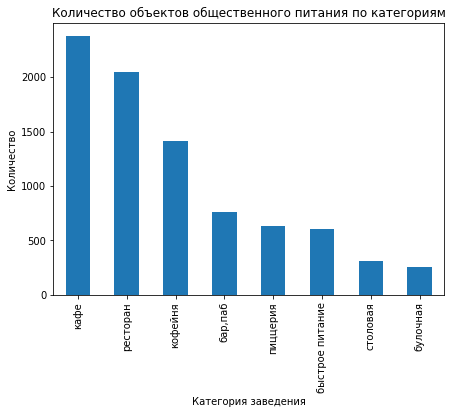

In [16]:
data['category'].value_counts().plot.bar(figsize=(7, 5))
plt.xlabel('Категория заведения')
plt.ylabel('Количество')
plt.title('Количество объектов общественного питания по категориям')
plt.show()

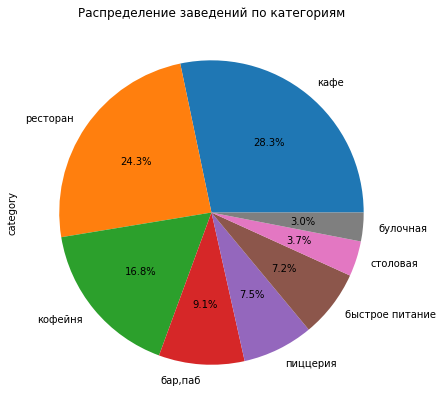

In [17]:
# Построим круговую диаграмму и отразим долю заведений каждой категории от общего числа:

data['category'].value_counts().plot(kind='pie', figsize = (10,7), autopct='%1.1f%%')
plt.title('Распределение заведений по категориям')
plt.show()

Наибольшее количество заведений в категории "кафе" - 28.3%,  
на втором месте - "рестораны", их 24.3%. Третью позицию занимают кофейни - 16.8%. Остальные категории имеют небольшой процент в общей базе (от 3 до 9%).

### 3.2. Количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. 

In [18]:
data['seats'].describe()

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
25%        40.000000
50%        75.000000
75%       140.000000
max      1288.000000
Name: seats, dtype: float64

Для оценки представленной информации о посадочных местах построим график (боксплот) и посмотрим на рамах данных и имеющиеся выбросы, т.к. при анализе столбца видно, что имеются данные о более чем 1000 посадочных мест в заведении. Информация даже для масштабов Москвы немного сомнительная.

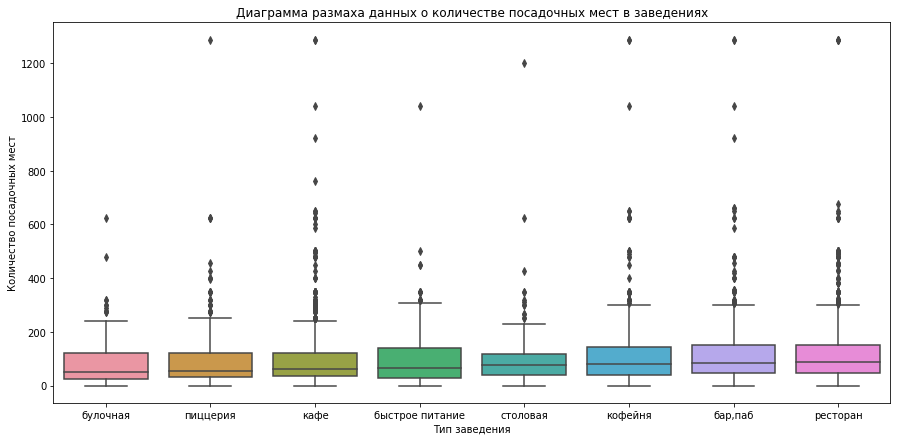

In [19]:
plt.figure(figsize=(15,7))
sns.set_palette('rocket')
ax = sns.boxplot(
    y='seats', 
    x='category', 
    data=data, 
    order=data.groupby('category')['seats'].median().sort_values().index
)
sns.set(rc={'figure.figsize':(13,13)})
plt.title('Диаграмма размаха данных о количестве посадочных мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.show()

Имеется очень большой разброс количества посадочных мест. Но для дальнейшего анализа предлагаю оценить количество заведений с количеством мест более 450 и, при возможности, очистить данные от выбросов, т.к. заведения с бОльшим количеством все же - редкость.

In [20]:
data[data['seats'] > 450]['name'].count()

108

Таких заведений всего 108 штук. Очистим данные от выбросов с минимальными потерями.

In [21]:
df_more_450 = data[data['seats'] > 450]
data = data.query('index not in @df_more_450.index')

In [22]:
data[data['seats'] > 450]['name'].count()

0

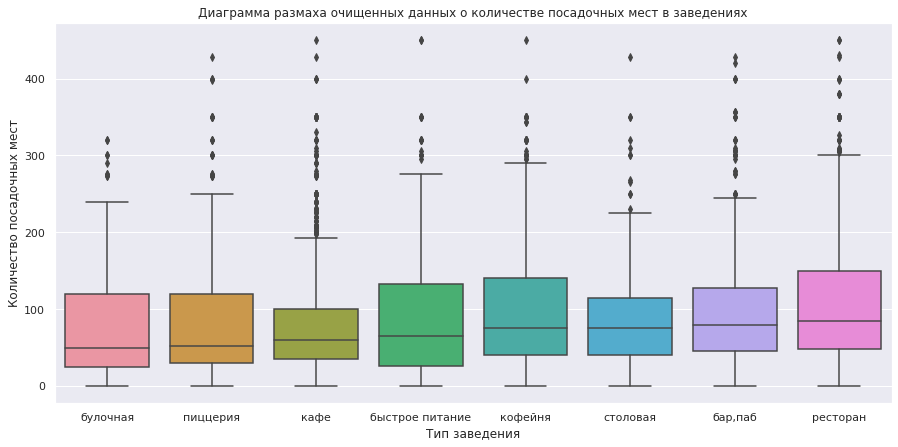

In [23]:
plt.figure(figsize=(15,7))
sns.set_palette('rocket')
ax = sns.boxplot(
    y='seats', 
    x='category', 
    data=data, 
    order=data.groupby('category')['seats'].median().sort_values().index
)
sns.set(rc={'figure.figsize':(13,13)})
plt.title('Диаграмма размаха очищенных данных о количестве посадочных мест в заведениях')
plt.xlabel('Тип заведения')
plt.ylabel('Количество посадочных мест')
plt.show()



In [24]:
data.groupby('category')['seats'].describe().round(2).reset_index()

,category,count,mean,std,min,25%,50%,75%,max
0,"бар,паб",452.0,104.17,83.59,0.0,46.0,80.0,127.25,428.0
1,булочная,146.0,83.05,81.33,0.0,25.0,49.5,120.00,320.0
2,быстрое питание,347.0,95.02,91.61,0.0,26.5,65.0,132.50,450.0
3,кафе,1190.0,84.83,77.90,0.0,35.0,60.0,100.00,450.0
4,кофейня,733.0,97.23,84.15,0.0,40.0,75.0,140.00,450.0
5,пиццерия,422.0,87.04,83.69,0.0,30.0,52.0,120.00,428.0
6,ресторан,1235.0,107.99,83.13,0.0,48.0,84.0,150.00,450.0
7,столовая,162.0,89.72,77.27,0.0,40.0,75.0,115.00,428.0


Очищенные сведения позволяют провести более качественный анализ.  
Рассмотрим эти данные под другим углом: выделим медианные значения и отразим их на графике.

In [25]:
category_seats = data.pivot_table (index = 'category', values = 'seats', aggfunc = 'median').sort_values(by='seats')
category_seats = category_seats.reset_index()
display (category_seats)

,category,seats
0,булочная,49.5
1,пиццерия,52.0
2,кафе,60.0
3,быстрое питание,65.0
4,кофейня,75.0
5,столовая,75.0
6,"бар,паб",80.0
7,ресторан,84.0


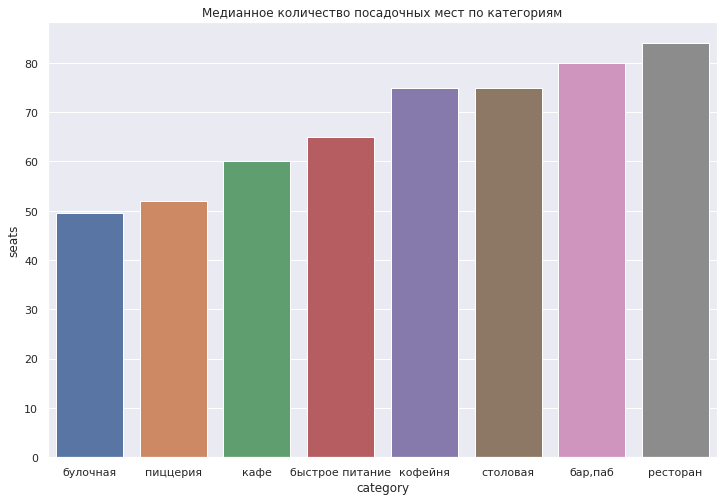

In [26]:
plt.figure(figsize=(12, 8))
plt.title ('Медианное количество посадочных мест по категориям')
sns.barplot (data = category_seats, x = 'category', y = 'seats');

Мы видим, что в среднем для всех категорий заведений медианное число посадочных мест находится в диапазоне от 50 до 86. Меньше всего посадочных мест в заведениях, рассчитанных на кратковременное пребывание посетителей и их частую смену - булочных, пиццериях, заведениях быстрого питания и кафе. Заведения, рассчитанные на более долгое пребывания посетителя - бары, пабы, кофейни и рестораны, имеют в среднем большее число посадочных мест. Исключением можно считать столовые, которые сочетают в себе и большое число посадочных мест и быстроту обслуживания.

### 3.3. соотношение сетевых и несетевых заведений в датасете.

Рассчитаем количество сетевых и несетевых заведений в датасете:

In [27]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5140
1,1,3158


0 — заведение не является сетевым  
1 — заведение является сетевым  

Исходя из представленных данных, в Москве преобладают несетевые заведения.   
Проиллюстрируем соотношение на графике.

In [28]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

По графику видно, что почти 62% заведений в Москве - несетевые.

### 3.4. Какие категории заведений чаще являются сетевыми? 

Отберем заведения, принадлежащие к сетям, и посмотрим их количество в каждой их категорий:

In [29]:
chain_data = data[data['chain'] == 1].groupby('category')['name'].count().reset_index().sort_values(by='name', ascending=False)

In [30]:
chain_data

,category,name
3,кафе,766
6,ресторан,714
4,кофейня,709
5,пиццерия,328
2,быстрое питание,231
0,"бар,паб",166
1,булочная,155
7,столовая,87


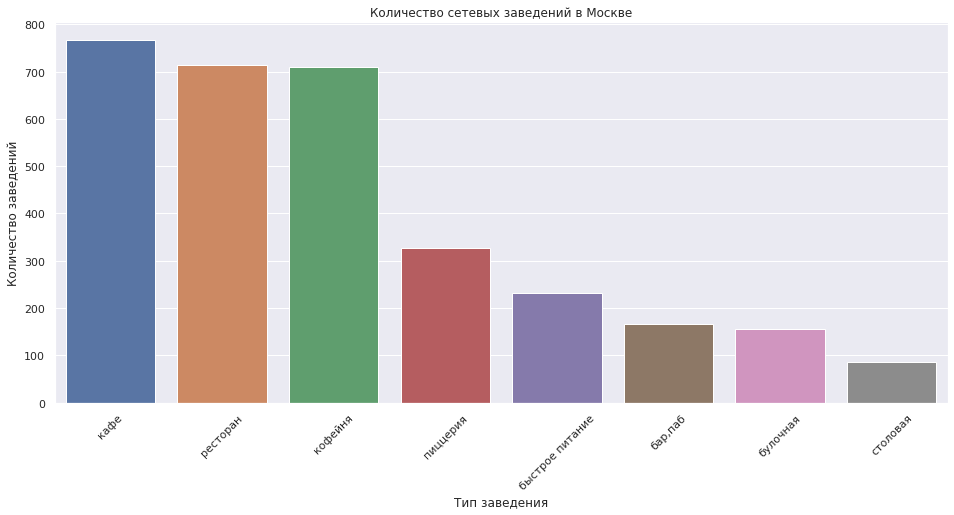

In [31]:
f, ax = plt.subplots(figsize=(16, 7))

ax = sns.barplot(data=chain_data, x='category', y='name')

ax.set_xlabel('Тип заведения')
ax.set_ylabel('Количество заведений')
ax.set_title('Количество сетевых заведений в Москве')
plt.xticks(rotation=45)
plt.show()

Среди сетевых заведений Москвы преобладают кафе, рестораны и кофейни. Сохраняется тенденция соотношения количества заведений в категории к общему количеству заведений как и при общем анализе, без привязки принадлежности к сети.

Посмотрим разбивку количества заведений в категории для сетевых/несетевых заведений:

In [32]:
chain_objects = data.groupby(['category', 'chain'])['name'].count().reset_index()
chain_objects.columns = ['object_type', 'chain', 'count']
chain_objects['chain'] = chain_objects['chain'].astype(object)
chain_objects = chain_objects.sort_values(['object_type', 'count'])
chain_objects

,object_type,chain,count
1,"бар,паб",1,166
0,"бар,паб",0,582
2,булочная,0,99
3,булочная,1,155
5,быстрое питание,1,231
4,быстрое питание,0,370
7,кафе,1,766
6,кафе,0,1583
8,кофейня,0,686
9,кофейня,1,709


Отобразим полученные данные на графике для наглядности:

In [33]:
fig = px.bar(chain_objects,
             x='count',
             y='object_type',
             text='count',
             template='plotly_white',                   
             color='chain',
             category_orders={"chain": ["сетевой", "несетевой"]}
            )

fig.update_layout(title='Соотношение сетевых/несетевых заведений',
                   xaxis_title='Количество заведений',
                   yaxis_title='Категория',
                 )
fig.show()

In [34]:
# Создадим сводную таблицу, в которой отразим количестве сетевых и несетевых заведений по категориям:

category_chain = data.pivot_table (index = 'category', columns = 'chain', values = 'name', aggfunc = 'count')
category_chain.columns = ['non_chain', 'chain']

# Рассчитаем доли сетевых и несетевых заведений по категориям:

category_chain ['chain_rate'] = category_chain ['chain'] / (category_chain ['non_chain'] + category_chain ['chain']) * 100
category_chain ['non_chain_rate'] = category_chain ['non_chain'] / (category_chain ['non_chain'] + category_chain ['chain']) * 100
category_chain = category_chain.drop (columns = ['non_chain', 'chain'])
category_chain.columns = [ 'Сетевые', 'Несетевые']
category_chain = category_chain.sort_values (by='Сетевые')

display (category_chain)

,Сетевые,Несетевые
category,,
"бар,паб",22.192513,77.807487
столовая,27.795527,72.204473
кафе,32.609621,67.390379
ресторан,35.575486,64.424514
быстрое питание,38.435940,61.564060
кофейня,50.824373,49.175627
пиццерия,52.229299,47.770701
булочная,61.023622,38.976378


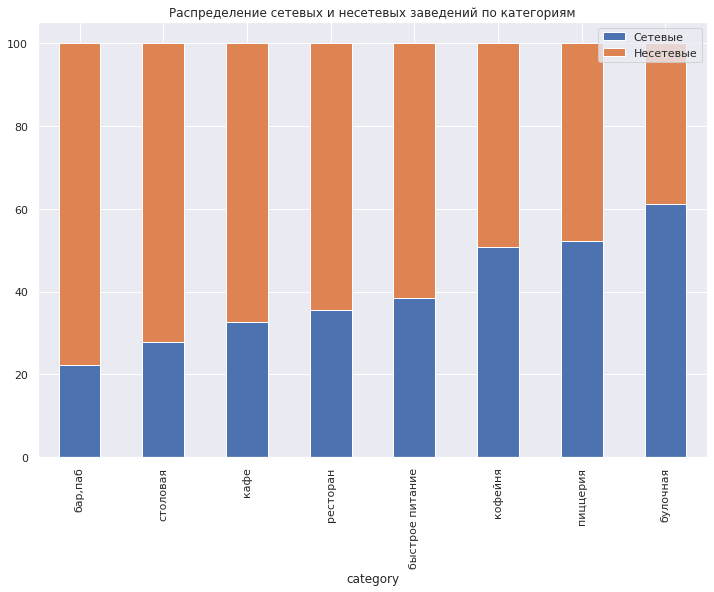

In [35]:
category_chain.plot(kind = 'bar', stacked = True, 
                    title='Распределение сетевых и несетевых заведений по категориям', figsize = (12,8));

А вот в разрезе можно увидеть подробнее, какое соотношение несетевых заведений к сетевым внутри каждой категории. Хоть в целом и было установлено, что несетевой бизнес преобладает над сетями, в некоторых категориях все же есть отличающиеся данные:  
например, среди кофеен и пиццерий преобладают сетевики, даже небольшая категория "булочных" представлена сетевыми заведениями в большем количестве, нежели самостоятельные заведения.

### 3.5. топ-15 популярных сетей в Москве. 

Найдем топ-15 самых популярных сетей (популярность определяется по количеству представленных заведений в регионе исследования):

In [36]:
top_15 = data[data['chain'] == 1].groupby(['name', 'category']).agg({'name':'count'})
top_15.columns = ['count']
top_15 = top_15.reset_index()
top_15 = top_15.sort_values(by='count', ascending=False).head(15)
top_15

,name,category,count
1119,шоколадница,кофейня,116
495,домино'с пицца,пиццерия,76
488,додо пицца,пиццерия,74
204,one price coffee,кофейня,70
1135,яндекс лавка,ресторан,68
71,cofix,кофейня,65
240,prime,ресторан,48
614,кофепорт,кофейня,42
629,кулинарная лавка братьев караваевых,кафе,38
957,теремок,ресторан,36


In [37]:
fig = px.bar(top_15,
             x='count',
             y='name',
             text='count',
             color='name',
             height=500,
             width=1000
             )
fig.update_layout(title = 'Топ-15 сетей Москвы по количеству заведений',
                  xaxis_title = 'Количество заведений',
                  yaxis_title = 'Название заведений',
                  showlegend = False)
fig.show()

Лидерами сетевых заведений являются кафе "Шоколадница", пиццерии "Домино'с" и "Додо", а также кофейни "One Price Coffee" и "Cofix". Так же в 5-ку лидеров входит ресторан доставки готовой еды "Яндекс Лавка". Это очень известные заведения, наверное, каждый в Москве хоть раз бывал в этих заведениях. Общей объединяющей чертой этих заведений, я считаю, скорость обслуживания и доступный средний чек. Так же заведения представлены практически в любом районе города. Но эту информацию мы проверим в дальнейшем исследовании.

### 3.6. общее количество заведений и количество заведений каждой категории по районам.

Создадим сводную таблицу количества заведений в разрезе админ.районов/округов Москвы:

In [38]:
data_district = pd.pivot_table(data, index = ['district'], values = 'name', aggfunc = 'count')
data_district.columns = ['count']
data_district = data_district.reset_index()
data_district['distr'] = [''.join([j[0].upper() for j in i.replace('-', ' ').split()]) for i in data_district['district'].to_list()]
data_district = data_district[['district', 'distr', 'count']]
data_district['%_count'] = round(data_district['count']/data_district['count'].sum()*100, 2)
data_district = data_district.sort_values('count', ascending=False)
(
    data_district.style
    .background_gradient(cmap='mako_r', axis=0)
) 

,district,distr,count,%_count
5,Центральный административный округ,ЦАО,2207,26.610000
3,Северо-Восточный административный округ,СВАО,887,10.690000
8,Южный административный округ,ЮАО,887,10.690000
2,Северный административный округ,САО,876,10.560000
1,Западный административный округ,ЗАО,823,9.920000
0,Восточный административный округ,ВАО,789,9.510000
6,Юго-Восточный административный округ,ЮВАО,713,8.600000
7,Юго-Западный административный округ,ЮЗАО,704,8.490000
4,Северо-Западный административный округ,СЗАО,409,4.930000


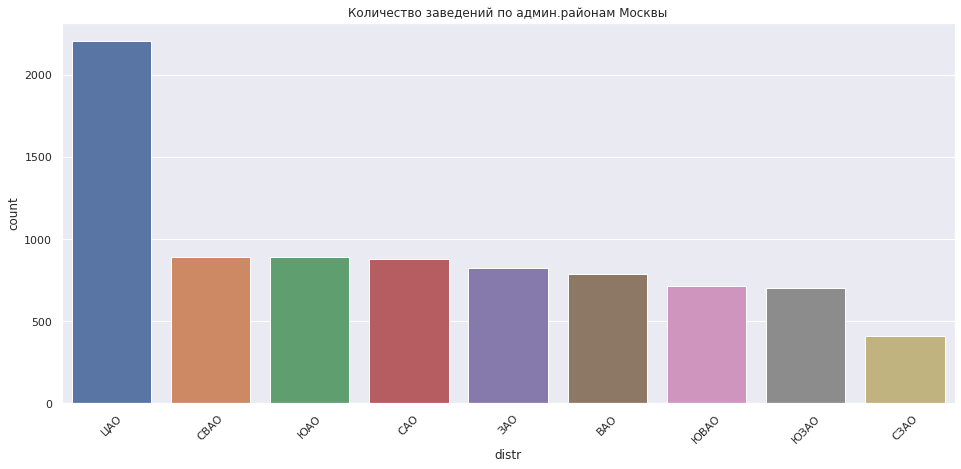

In [39]:
f, ax = plt.subplots(figsize=(16, 7))
sns.barplot(x='distr', y='count', data=data_district)
plt.xticks(rotation=45)
plt.title('Количество заведений по админ.районам Москвы')
plt.show()

In [40]:
fig = px.bar(data_district,
             x='count',
             y='distr',
             template='plotly_white',                    
             color='district'
            )
fig.update_layout(title='Количество заведений по районам Москвы',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название района',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

Посмотрим на распределение заведений по АО в разрезе категорий:

In [41]:
data_district_2 = pd.pivot_table(data, index = ['district', 'category'], values = 'name', aggfunc = 'count')
data_district_2.columns = ['count']
data_district_2 = data_district_2.reset_index()
data_district_2.sort_values('count', ascending=False)

,district,category,count
46,Центральный административный округ,ресторан,656
43,Центральный административный округ,кафе,455
44,Центральный административный округ,кофейня,423
40,Центральный административный округ,"бар,паб",359
51,Юго-Восточный административный округ,кафе,282
...,...,...,...
32,Северо-Западный административный округ,"бар,паб",23
39,Северо-Западный административный округ,столовая,18
63,Юго-Западный административный округ,столовая,17
49,Юго-Восточный административный округ,булочная,13


In [42]:
fig = px.bar(data_district_2,
             x='count',
             y='district',
             template='plotly_white',                 
             color='category'
            )
# оформляем график
fig.update_layout(title='Количество заведений каждой категории по районам',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название категорий',
                   yaxis={'categoryorder':'total ascending'}
                 )
fig.show()

В Москве 9 административных районов.  
Наибольшее количество заведений общественного питания находятся в ЦАО - 26.6%; среди них наиболее популярная категория заведений - рестораны.  
Наименьшее количество заведений общественного питания находится в СЗАО - 4.93%.  
В целом, по округам города преобладают кафе, на втором месте - рестораны.

### 3.7. Визуализируем распределение средних рейтингов по категориям заведений. 

In [43]:
data_rating = data.groupby('category').agg({'rating': 'mean'}).round(2)
data_rating.columns = ['mean']
data_rating = data_rating.reset_index()
data_rating = data_rating.sort_values('mean', ascending=False)
data_rating

,category,mean
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


In [44]:
fig = px.bar(data_rating,
             x='mean',
             y='category',
             text='mean',
             template='plotly_white', 
             color='category'                   
            )
# оформляем график
fig.update_layout(title='Распределение средних рейтингов по категориям заведений',
                   xaxis_title='Рейтинг',
                   yaxis_title='Название категорий')
fig.update_xaxes(range=[4, 4.5])
fig.show()

Наивысший средний рейтинг отмечен у категории заведений "Бар", далее с небольшим разрывом следуют заведения в категориях "Пиццерия, ресторан, кофейня и булочная".
Среднее и медианное значение в столбце "Рейтинг" практически совпадают, что говорит об однородности оценок в каждой из категорий.

### 3.8. Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района.

In [45]:
rating_ao = pd.pivot_table(data, index = 'district', values = 'rating', aggfunc = ['mean', 'median'])
rating_ao.columns = ['mean', 'median']
rating_ao = rating_ao.reset_index()
rating_ao

,district,mean,median
0,Восточный административный округ,4.174271,4.3
1,Западный административный округ,4.179854,4.3
2,Северный административный округ,4.238997,4.3
3,Северо-Восточный административный округ,4.148649,4.2
4,Северо-Западный административный округ,4.208802,4.3
5,Центральный административный округ,4.377254,4.4
6,Юго-Восточный административный округ,4.100842,4.2
7,Юго-Западный административный округ,4.172869,4.3
8,Южный административный округ,4.184216,4.3


In [46]:
# Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_ao,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)
m

На карте видно, что самый "горячий" АО - ЦАО - там самый высокий средний рейтинг у заведений общественного питания и достигает отметки в 4,4 балла. Самые низкие рейтинги наблюдаются в ЮВАО - там средний рейтинг колеблится ближе к 4 баллам.

### 3.9. Отобразите все заведения датасета на карте с помощью кластеров

In [47]:
# Отобразим объекты датасета на карте Москвы
m1 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m1)

# создадим функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        tooltip=f"{row['category']} {row['name']} рейтинг {row['rating']}"
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m1

### 3.10. топ-15 улиц по количеству заведений.

In [48]:
top15_street = data.groupby ('street')['name'].count().sort_values(ascending = False).head (15).reset_index()

Сохраним в переменную названия улиц из top15_street для дальнейшего среза:

In [49]:
top_streets = top15_street ['street'].tolist()

top_streets

['проспект Мира',
 'Профсоюзная улица',
 'Ленинский проспект',
 'проспект Вернадского',
 'Дмитровское шоссе',
 'Каширское шоссе',
 'Варшавское шоссе',
 'Ленинградский проспект',
 'Ленинградское шоссе',
 'МКАД',
 'Люблинская улица',
 'Кутузовский проспект',
 'улица Вавилова',
 'Пятницкая улица',
 'Алтуфьевское шоссе']

In [50]:
# Построим сводную таблицу с распределением заведений различных категорий по улицам из топ-15:
street_category = data.query ('street in @top_streets').pivot_table (index = 'street', 
                                                                     columns = 'category', 
                                                                     values = 'name', 
                                                                     aggfunc = 'count')
street_category

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Алтуфьевское шоссе,5.0,1.0,5.0,13.0,9.0,3.0,10.0,1.0
Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,2.0
Ленинградский проспект,13.0,3.0,2.0,8.0,18.0,6.0,20.0,2.0
Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
Ленинский проспект,10.0,3.0,2.0,25.0,23.0,5.0,28.0,5.0
Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0


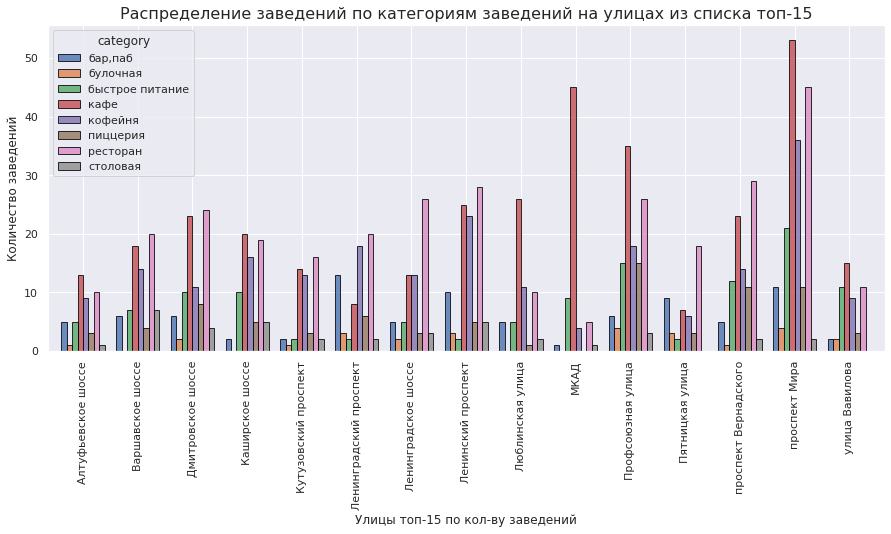

In [51]:
# Построим график количества заведений в Москве в разрезе категорий и улиц из топ-15
street_category.plot.bar(figsize=[15, 6], width=0.79, edgecolor = 'black', alpha=0.8)
plt.title('Распределение заведений по категориям заведений на улицах из списка топ-15', size=16)
plt.xticks(rotation=90)
plt.xlabel('Улицы топ-15 по кол-ву заведений')
plt.ylabel('Количество заведений')
plt.show()

Диаграмма показывает распределение категорий заведений на улицах из топ-15. Анализ диаграммы позволяет сделать следующие выводы:

* самыми популярными на практически всех рассматриваемых улицах - кафе и рестораны;
* на некоторых из улиц в принципе отсутствуют заведения определенной категории (например, на Люблинской улице и на МКАД нет булочных);
* доля кофеен существенно ниже среднего на  МКАДе и улице Пятницкой.

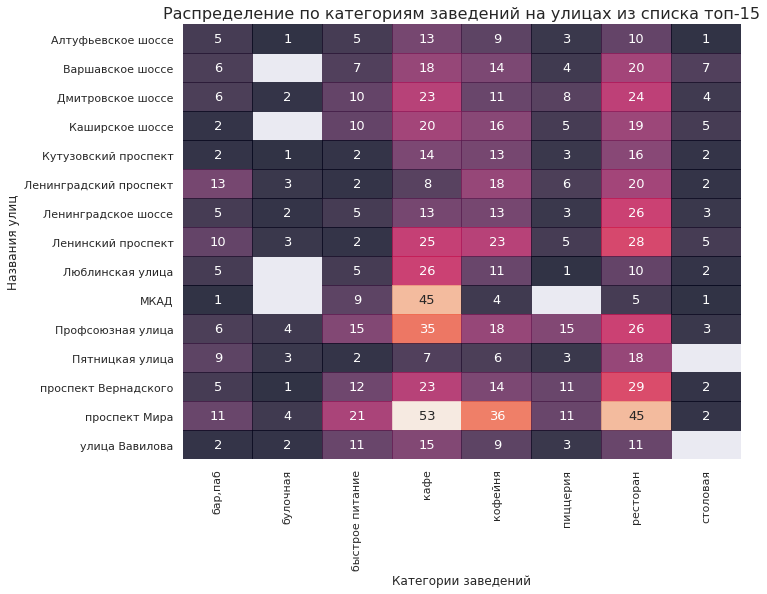

In [52]:
plt.figure(figsize=(10, 8))
sns.heatmap(street_category, alpha=0.8, annot= True , annot_kws={"size":13}, cbar= False)
plt.title('Распределение по категориям заведений на улицах из списка топ-15', size=16)
plt.xlabel('Категории заведений')
plt.ylabel('Названия улиц')
plt.show()

На тепловой карте так же видно распределение заведений по улицам. При отсутствии сведений о заведении на карте отображается пустая ячейка, что портит общий вид визуализации. однако, такой график позволяет еще раз подтвердить полученные ранее данные о концентрации кафе и ресторанов на улицах города. И непопулярность таких заведений, как "столовая", "булочная" и "пиццерия".

### 3.11. Улицы, на которых находится только один объект общепита. 
Что можно сказать об этих заведениях?

In [53]:
street_count = data.groupby ('street')['name'].count().reset_index()
street_count.columns = ['street', 'count']
only_1 = street_count[street_count['count']==1]['street'].tolist()

# Создадим таблицу с данными о таких заведениях:
only_1_rest = data.query ('street in @only_1')[['street', 'name','category','chain']]
only_1_rest

,street,name,category,chain
15,улица Бусиновская Горка,дом обеда,столовая,0
21,Прибрежный проезд,7/12,кафе,0
25,парк Левобережный,в парке вкуснее,кофейня,1
58,Угличская улица,coffeekaldi's,кофейня,1
60,ландшафтный заказник Лианозовский,чебуречная история,кофейня,1
...,...,...,...,...
8294,улица Артюхиной,wtfcoffee,кофейня,0
8317,Кузьминская улица,беседка,кафе,1
8376,Грайвороновская улица,шоколад имбирь корица,кофейня,0
8379,Новороссийская улица,лагман хаус,кафе,1


In [54]:
only_1_rest['category'].value_counts()

кафе               160
ресторан            93
кофейня             85
бар,паб             39
столовая            36
быстрое питание     23
пиццерия            15
булочная             8
Name: category, dtype: int64

Всего заведений, расположенных одиноко на улицах Москвы, исследовано 459.

Один объект  на улице говорит о том, что либо улица очень короткая, либо малопроходимая;  
на таких улицах располагаются небольшие кафе или рестораны;  
столовые и быстрое питание требуют потока посетителей, которого нет на данных улицах.  

Скорее всего заведения-"одиночки" являются несетевыми (это может быть связано с тем, что сети открываются на улицах с большим трафиком).

### 3.12. Постройте фоновую картограмму (хороплет) ценового индикатора для каждого района. 

Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитаем медиану этого столбца для каждого района. Используем это значение в качестве ценового индикатора района. Построим фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируем цены в центральном административном округе и других. предположим, как удалённость от центра влияет на цены в заведениях.

In [55]:
avg_bill_district = data.groupby ('district')['middle_avg_bill'].median().reset_index().sort_values (by = 'middle_avg_bill', ascending = False)
avg_bill_district

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,550.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [56]:
m2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту

Choropleth(
    geo_data=state_geo,
    data=avg_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='Reds',
    fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m2)

display (m2)

Самыми дорогими районами предсказуемо стали ЦАО и ЗАО (медианное значение среднего чека равно 1000 рублей);  
за ними следуют СЗАО и САО (700 и 650 рублей соответственно);  
далее расположились ЮЗАО (600 рублей) и ВАО (550 рублей);  
районами с самыми бюджетными заведениями оказались СВАО и ЮАО (500 рублей) и ЮВАО (450 рублей).

### 3.13. Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных.

### Связь рейтинга и среднего чека

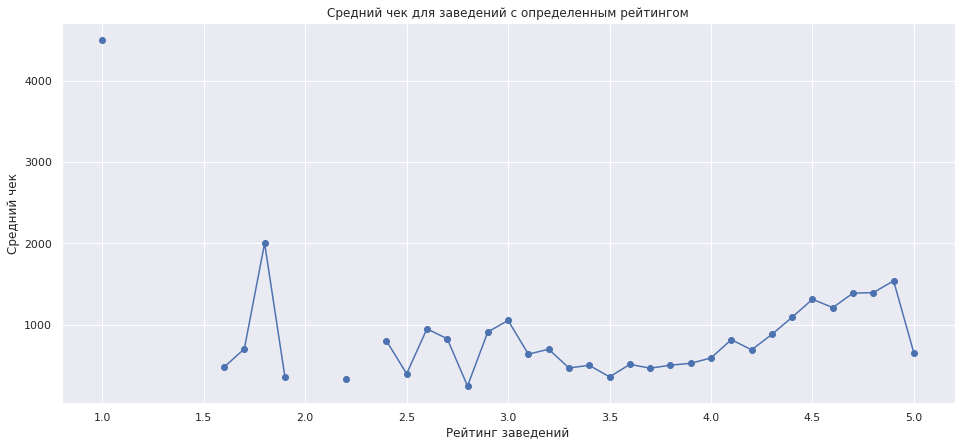

In [57]:
# Построим график соотношения среднего чека для каждого рейтинга заведения:
plt.subplots(figsize=(16, 7))
ax = data.groupby('rating')['middle_avg_bill'].mean()
ax.plot(marker='o', title = 'Средний чек для заведений с определенным рейтингом')
plt.xlabel('Рейтинг заведений')
plt.ylabel('Средний чек');

Судя по графику, кому-то не очень понравилось обслуживание в заведении со средним чеком более 4,5 тыс. рублей. В целом, рейтинг заведений не сильно зависит от ценовой политики. Конечно, средний чек является одним из критериев при выставлении оценки заведению, но все же оценка формируется исходя из общего полученного впечатления от посещения заведения.  
Есть низкие оценки у заведений со счетом, выше среднего по городу. При этом, в некоторых более "рейтинговых" заведениях этот же средний чек значительно ниже среднего по городу.

### Вывод

Проведен анализ заведений общественного питания Москвы.  
1. По количеству заведений лидируют кафе (28.3%), чуть меньше ресторанов - 24.3%. Категория "булочные" на последнем месте - 3 %.
2. Также, в ходе анализа выявлено, что больше всего посадочных мест предоставляют рестораны, что логично, т.к. люди обычно празднуют там события с большой численностью людей (свадьбы, корпоративы и тд.). Далее идут заведения быстрого питания - кафе, бары, столовые.
3. В Москве 61.9% мест являются несетевыми. По графику видно, что большинство за несетевыми заведениями. Но несколько исключений.
4. Самая популярная сеть в Москве - Шоколадница. На втором и третьем месте расположились известные пиццерии.

5. В Москве 9 административных округов. Основная масса заведений располагаются в центре Москвы. По графику видно, что больше всего заведений располагается в Центральном админинстративном округе. В нем преобладают кафе, кофейни и рестораны. Кафе распределены равномерно по всем округам. 

6. Из топ-15 больше всего заведений находятся в Центральном админинстративном округе. В основном это кафе, кофейни и рестораны. Примерно одинаковые показатели у Южного, Северного, Северо-Восточного и Западного админинстративных округов. Здесь приоритеты меняются в сторону категории быстрого питания. Меньше всего заведений из топ-15 в Северо-Западном админинстративном округе.
7. Самый высокий рейтинг в заведениях в Центральном админинстративном округе - 4.38. Самый низкий - в Юго-Восточном админинстратвном округе - 4.1.

8. У категорий бар/паб наивысший рейтинг 4.39. У пиццерий, ресторанов, кофеин и булочных примерно одинаковый рейтинг. Самый маленький рейтинг у ресторанов быстрого питания. 

9. Больше всего заведений на проспекте Мира. Преобладают кафе и рестораны. Далее идет Профсоюзная улица. 

10. При этом, почти 500 улиц имеют только одно заведение. Больше всего таких представлено в категории "кафе".

11. Самый высокий средний чек в Центральном и Западном округах. Самый маленький - в Юго-Восточном административном округе. В целом, средний чек округов вокруг центрального в среднем отличается в 1,5 - 2 раза.

## Шаг 4. Детализируем исследование: открытие кофейни.

Основатели фонда «Shut Up and Take My Money» хотят открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Проведем дальнейший анализ, ограничиваясь только данными по категории "кофейни".

In [58]:
coffee_house = data[data['category']=='кофейня']
coffee_house.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
3,dormouse coffee shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
25,в парке вкуснее,кофейня,"Москва, парк Левобережный",Северный административный округ,"ежедневно, 10:00–21:00",55.878453,37.460028,4.3,NaN,NaN,NaN,NaN,1,NaN,парк Левобережный,False
45,9 bar coffee,кофейня,"Москва, Коровинское шоссе, 41, стр. 1",Северный административный округ,пн-пт 08:00–18:00,55.885837,37.513422,4.0,NaN,NaN,NaN,NaN,1,46.0,Коровинское шоссе,False
46,cofefest,кофейня,"Москва, улица Маршала Федоренко, 6с1",Северный административный округ,пн-пт 09:00–19:00,55.879934,37.492522,3.6,NaN,NaN,NaN,NaN,1,NaN,улица Маршала Федоренко,False
52,cofix,кофейня,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 08:00–22:00",55.878531,37.479395,3.8,NaN,NaN,NaN,NaN,1,NaN,улица Дыбенко,False


### 4.1. Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [59]:
print('Всего в датасете ', coffee_house['name'].count(), 'кофеен')

Всего в датасете  1395 кофеен


In [60]:
coffee_house_district = pd.pivot_table(coffee_house, index = ['district'], values = 'name', aggfunc = 'count')
coffee_house_district.columns = ['count']
coffee_house_district = coffee_house_district.reset_index()
coffee_house_district['distr'] = [''.join([j[0].upper() for j in i.replace('-', ' ').split()]) for i in coffee_house_district['district'].to_list()]
coffee_house_district = coffee_house_district[['district', 'distr', 'count']].sort_values('count', ascending=False)
coffee_house_district

,district,distr,count
5,Центральный административный округ,ЦАО,423
2,Северный административный округ,САО,186
3,Северо-Восточный административный округ,СВАО,159
1,Западный административный округ,ЗАО,146
8,Южный административный округ,ЮАО,131
0,Восточный административный округ,ВАО,104
7,Юго-Западный административный округ,ЮЗАО,95
6,Юго-Восточный административный округ,ЮВАО,89
4,Северо-Западный административный округ,СЗАО,62


Как и с общим распределением заведений, кофейни преобладают в ЦАО, их здесь больше 400. Наименьшее количество кофеен представлено в СЗАО, ЮЗАО и ЮВАО - обычных спальных районах. Низкую конкурентность можно рассматривать как один из критериев при выборе района расположения для будущего заведения.  
Проиллюстрируем количество кофеен по округам Москвы на графике:

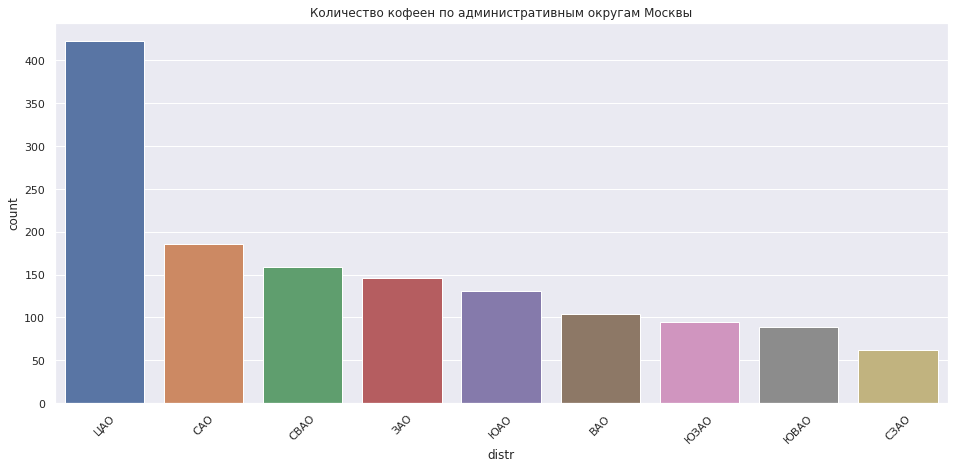

In [61]:
f, ax = plt.subplots(figsize=(16, 7))
sns.barplot(x='distr', y='count', data=coffee_house_district)
plt.xticks(rotation=45)
plt.title('Количество кофеен по административным округам Москвы')
plt.show()

In [62]:
# Нанесем на карту все кофейни:

m3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим пустой кластер:
marker_cluster = MarkerCluster().add_to(m3)

# Напишем функцию create_clusters, которая создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house.apply(create_clusters, axis=1)

# создаем хороплет и добавляем его на карту:
Choropleth(
    geo_data=state_geo,
    data=coffee_house.groupby ('district')['name'].count().reset_index(),
    columns=['district', 'name'],
    key_on='feature.name',
    fill_color='Blues',
    fill_opacity=0.8,
    legend_name='Количество кофеен в районе',
).add_to(m3)

# выводим карту
m3

### 4.2. Есть ли круглосуточные кофейни?

In [63]:
around_the_clock = coffee_house[coffee_house['is_24_7']==True]
around_the_clock.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24_7
200,wild bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
971,wild bean cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
1047,wild bean cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True
1214,wild bean cafe,кофейня,"Москва, МКАД, 65-й километр, 8",Северо-Западный административный округ,"ежедневно, круглосуточно",55.813787,37.390701,4.3,NaN,NaN,NaN,NaN,1,NaN,МКАД,True
1291,шоколадница,кофейня,"Москва, улица Народного Ополчения, 49, корп. 1",Северо-Западный административный округ,"ежедневно, круглосуточно",55.794815,37.494834,4.2,средние,Средний счёт:650–850 ₽,750.0,NaN,1,200.0,улица Народного Ополчения,True


In [64]:
around_the_clock['name'].count()

59

В Москве работают 59 круглосуточных кофеен.  

Отобразим на графике долю таких заведений в общем количестве кофеен города.

In [65]:
labels = ['Круглосуточные кофейни', 'Ограниченные часы работы'] 
values = [coffee_house[coffee_house['is_24_7']==True]['name'].count(), (
    coffee_house ['name'].count())-(coffee_house[coffee_house['is_24_7']==True]['name'].count())]

fig = go.Figure(data=[go.Pie(labels=labels, values=values, pull=[0.2, 0])])
fig.update_layout(title_text="Доля круглосуточных кофеен")
fig.show() 

### 4.3. Какие у кофеен рейтинги? Как они распределяются по районам?

In [66]:
rating_coffee_house = pd.pivot_table(coffee_house, index = 'district', values = 'rating', aggfunc = ['mean', 'median'])
rating_coffee_house.columns = ['mean', 'median']
rating_coffee_house = rating_coffee_house.reset_index()
rating_coffee_house

,district,mean,median
0,Восточный административный округ,4.284615,4.3
1,Западный административный округ,4.193151,4.2
2,Северный административный округ,4.291935,4.3
3,Северо-Восточный административный округ,4.216981,4.3
4,Северо-Западный административный округ,4.325806,4.3
5,Центральный административный округ,4.336879,4.3
6,Юго-Восточный административный округ,4.225843,4.3
7,Юго-Западный административный округ,4.286316,4.3
8,Южный административный округ,4.232824,4.3


In [67]:
# Построим фоновую картограмму (хороплет) со средним рейтингом заведений каждого района
state_geo = 'https://code.s3.yandex.net/data-analyst/admin_level_geomap.geojson'
moscow_lat, moscow_lng = 55.751244, 37.618423
m4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
Choropleth(
    geo_data=state_geo,
    data=rating_coffee_house,
    columns=['district', 'mean'],
    key_on='feature.name',
    fill_color='Oranges',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по округам Москвы',
).add_to(m4)
m4

Самые высокие рейтинги у заведений, расположенных в ЦАО и СЗАО (4,336 и 4,325 соответсвенно). Видимо, хороший сервис заслуживает высоких оценок. И это при том, что в СЗАО, как было установлено ранее, наименьшее количество кофеен по Москве. 
Ближайшие конкуренты высокого рейтинга распологаются в САО (там средняя оценка находится на уровне 4,29).  


### 4.4. На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?

Думаю, при расчете стоимости чашки кофе стоит ориентироваться на медианное значение для рассматриваемой категории заведений, т.к. среднее значение может быть искаженным за счет аномальных значений или реально завышенных цен в каких-то отдельных кофейнях, находящихся в центре или в других зонах повышенных цен (аэропорты, ТРЦ люксового сегмента и т.п.)

In [68]:
middle_coffee_cup_district = coffee_house.groupby ('district')['middle_coffee_cup'].median().reset_index().sort_values (by = 'middle_coffee_cup', ascending = False)
middle_coffee_cup_district

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,187.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


Мы видим, что средняя стоимость чашки капучино различается в зависимости от района. Так, дороже всего кофе обойдется в ЦАО, ЮЗАО и ЗАО (в среднем 190 рублей), чуть дешевле  в СЗАО, САО, СВАО (около 162 рублей) и ЮАО (150 рублей), а самый низкий показатель в ЮВАО и ВАО (около 140 рублей).  
При этом при определении цены следует принимать во внимание и другие параметры, такие как стоимость аренды помещения, затраты на персонал, электричество и продукты.

### 4.5. Принадлежность кофеен к сети

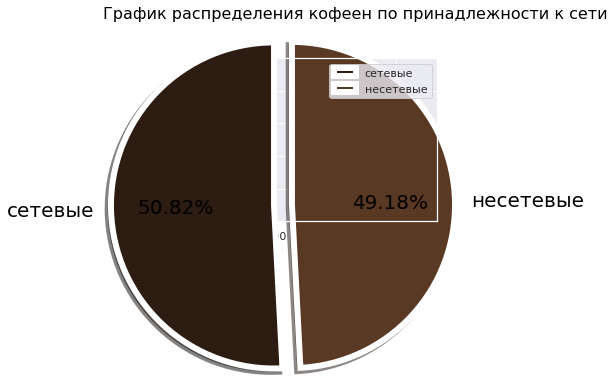

In [69]:
# Построим график распределения кофеен по принадлежности к сети
plt.figure(figsize=(3, 3))
explode = [0.1,0.01]
labels = ['сетевые', 'несетевые']
colors = sns.color_palette('copper')
plt.pie(coffee_house['chain'].value_counts().values,
        labels = labels,
        colors = colors,
        autopct = '%0.2f%%',
        explode = explode,
        shadow = 'True',
        startangle = 90,
        textprops = {'color': 'black','fontsize':20},
        wedgeprops = {'linewidth': 6},
        frame = 'true' ,
        center = (0.1,0.1),
        rotatelabels = False)
plt.title('График распределения кофеен по принадлежности к сети', loc='center', size=16, color='black', pad=40)
plt.legend(labels, loc=1)
plt.show()


In [70]:
cofe_house_chain_geo = coffee_house.groupby('name').agg({'address':'count'})
cofe_house_chain_geo.columns = ['count']
cofe_house_chain_geo = cofe_house_chain_geo.sort_values('count', ascending=False).reset_index().head(10)
cofe_house_chain_geo

,name,count
0,шоколадница,116
1,one price coffee,71
2,cofix,65
3,кофепорт,42
4,cofefest,31
5,кофемания,21
6,cinnabon,20
7,правда кофе,12
8,кофейня,9
9,krispy kreme,9


Среди представленных кофеен наибольшее количество принадлежит к сети "Шоколадница", One Price Coffе и Cofix.

## Шаг 5. Презентация

https://drive.google.com/file/d/194NCYwVS-wcgET0pYpLovua62eWF57l1/view?usp=drive_link

## Вывод:

На основании проведенного анализа стоит рассмотреть для открытия кофейни Северо-Западный административный округ, поскольку:  

* в этом районе представлено не так много кофеен, как в других районах Москвы, при этом, это район с хорошо развитой инфраструктурой, парками и плотной жилой застройкой;  
* средний чек заведений в данном районе выше среднего по Москве, что свидетельствует о потенциально более платежеспособных клиентах;  
* стоит рассмотреть локации поблизости от станций метро, вокзалов, парков и торговыми/культурно-развлекательными центрами.   
* При определении ценовой политики стоит ориентироваться на стоимость чашки кофе в диапазоне 160-170 рублей: такая цена будет конкуретноспособна почти в любом округе Москвы, при этом может покрыть максимальные затраты и предполагаемую прибыль.  

Возможно, стоит рассмотреть покупку готовой франшизы. Это позволит получить готову схему бизнеса и узнаваемый бренд по заранее определенной стоимости. Если у заказчиков нет опыта работы в данной сфере - этот вариант будет предпочтителен. Наиболее узнаваемые сети: Шоколадница, One Price Coffee, Cofix. Для окончательного выбора франшизы нужна иформация о ее стоимоти и анализ динамики роста продаж за последние пару лет.

Если заказчики хотят открыть что-то уникальное, следует подробнее изучить несетевые кофейни и определить перспективную нишу или придумать новую идею. Для этого нужно определиться с целевой аудиторией: студенты, офисные сотрудники, семьи с детьмя и т.п.  

Так же стоит учитывать возможности аренды подходящего помещения и количество посадочных мест. Оптимальным количеством для кофейни является посадка от 40-50 мест (10-15 столиков).